In [253]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn import manifold, datasets
from sklearn.preprocessing import StandardScaler
plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['figure.dpi'] = 600
import os
from collections import defaultdict
from sklearn import datasets

# Gene Expression with Raw reads

In [11]:
expression_file = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/quantification_stats/gene_expression_matrix/gene_expression_matrix.csv"
label_file = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/label/GSE57872_processed_label.csv"
exp_profile = pd.read_csv(expression_file,index_col=0).transpose()
label_info = pd.read_csv(label_file,index_col=0)

In [12]:
exp_profile.shape

(875, 57820)

In [13]:
exp_profile.head()

Geneid,ENSG00000223972.4,ENSG00000227232.4,ENSG00000243485.2,ENSG00000237613.2,ENSG00000268020.2,ENSG00000240361.1,ENSG00000186092.4,ENSG00000238009.2,ENSG00000239945.1,ENSG00000233750.3,...,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
SRR1295086,0,1,0,0,1,0,0,0,0,0,...,1755,3,1,3,1554,290,0,2088,5,10
SRR1294852,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,3,0,0,1,0,0
SRR1294576,0,0,0,0,0,0,0,0,0,0,...,1143,0,0,5,560,307,0,418,0,0
SRR1294525,0,0,0,0,0,0,0,0,0,0,...,127,0,0,0,2,0,0,896,0,0
SRR1295041,0,0,0,0,0,0,0,0,0,0,...,320,0,0,0,422,134,0,361,1,5


In [15]:
label_info.head()

,label,single_or_bulk,sample_title,subtype,description
run_accession,,,,,
SRR1294492,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A01,NaN,Please note that this sample did not pass the ...
SRR1294493,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A02,subtype: Pro,processed data file: GBM_data_matrix.txt
SRR1294494,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A03,subtype: Pro+Cla,processed data file: GBM_data_matrix.txt
SRR1294495,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A04,NaN,Please note that this sample did not pass the ...
SRR1294496,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A05,subtype: Pro+Cla,processed data file: GBM_data_matrix.txt


In [16]:
# only consider single cell data, filter out bulk data
filtered_type = list(label_info['label'].value_counts()[label_info['label'].value_counts() == 96].index)
label_info_filtered = label_info[label_info['label'].isin(filtered_type)]
# change index for label_index for consistence
#label_info_filtered = label_info_filtered.set_index('run_accession')
label_info_filtered.index.name = 'Geneid'
# remove "MGH30L"
label_info_filtered = label_info_filtered.loc[label_info_filtered['label']!="MGH30L",]
# merge "MGH26-2" and 'MGH26'
label_info_filtered['label'].replace('MGH26-2','MGH26',inplace=True)
# update cell type list
filtered_type = label_info_filtered['label'].value_counts().index

In [18]:
label_info_filtered.head()

,label,single_or_bulk,sample_title,subtype,description
Geneid,,,,,
SRR1294492,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A01,NaN,Please note that this sample did not pass the ...
SRR1294493,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A02,subtype: Pro,processed data file: GBM_data_matrix.txt
SRR1294494,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A03,subtype: Pro+Cla,processed data file: GBM_data_matrix.txt
SRR1294495,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A04,NaN,Please note that this sample did not pass the ...
SRR1294496,MGH26,Single cell mRNA-seq,Single cell mRNA-seq_MGH26_A05,subtype: Pro+Cla,processed data file: GBM_data_matrix.txt


In [19]:
label_info_filtered.shape

(768, 5)

In [20]:
# filter single cell from expression matrix
exp_profile_filtered = exp_profile.loc[label_info_filtered.index.values,]

In [21]:
exp_profile_filtered.shape

(768, 57820)

In [22]:
# label for cells
cell_labels = label_info_filtered.loc[exp_profile_filtered.index.values,]['label'].values

## PCA

In [24]:
# do pca for gene expression profile with raw read counts
pca = PCA(n_components=2)
pca.fit(exp_profile_filtered)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [25]:
print(pca.explained_variance_ratio_)

[0.44604954 0.13024511]


In [26]:
# draw figure
X_r = pca.transform(exp_profile_filtered)
x_1 = X_r.ravel(order='F')[:X_r.shape[0]]
x_2 = X_r.ravel(order='F')[X_r.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (raw reads)')

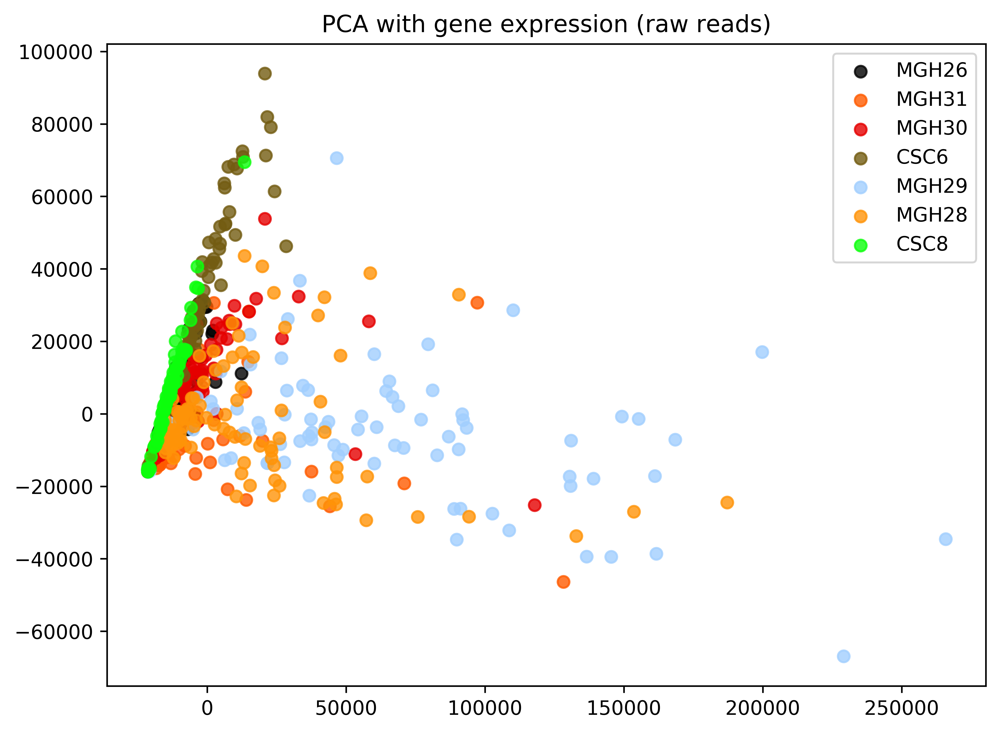

In [27]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1[cell_labels == target_name], x_2[cell_labels == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads)')

Text(0.5, 1.0, 'PCA with gene expression (raw reads-only patients)')

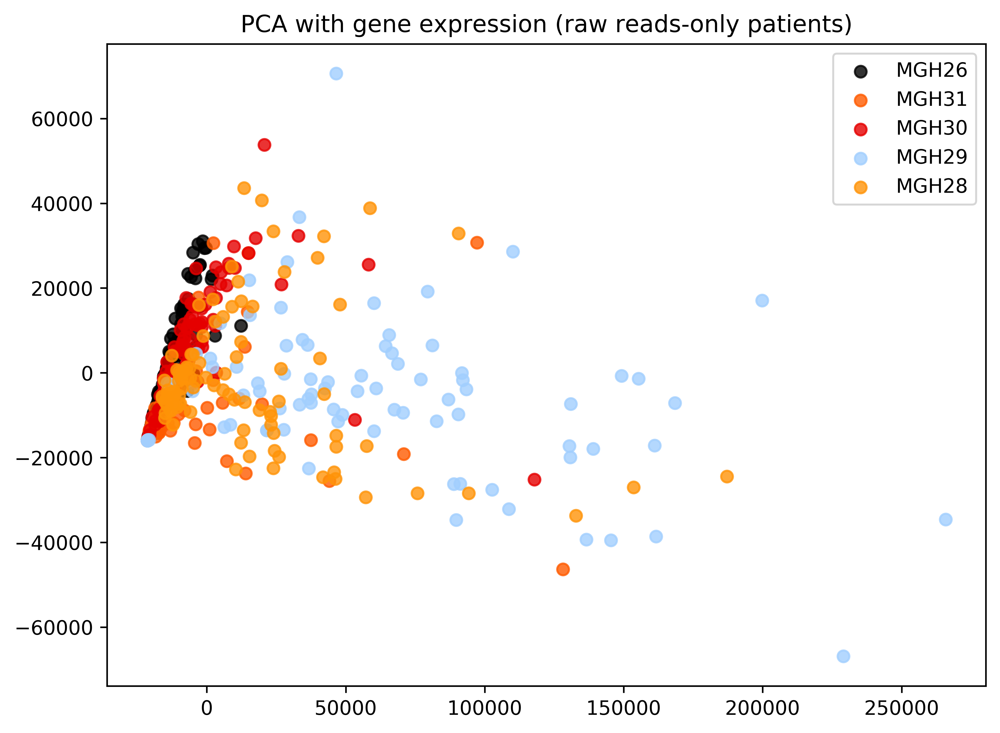

In [28]:
# only patients cell
for color, target_name in zip(colors, filtered_type):
    if ('MGH' in target_name):
        plt.scatter(x_1[cell_labels == target_name], x_2[cell_labels == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads-only patients)')

Text(0.5, 1.0, 'PCA with gene expression (raw reads-without patients)')

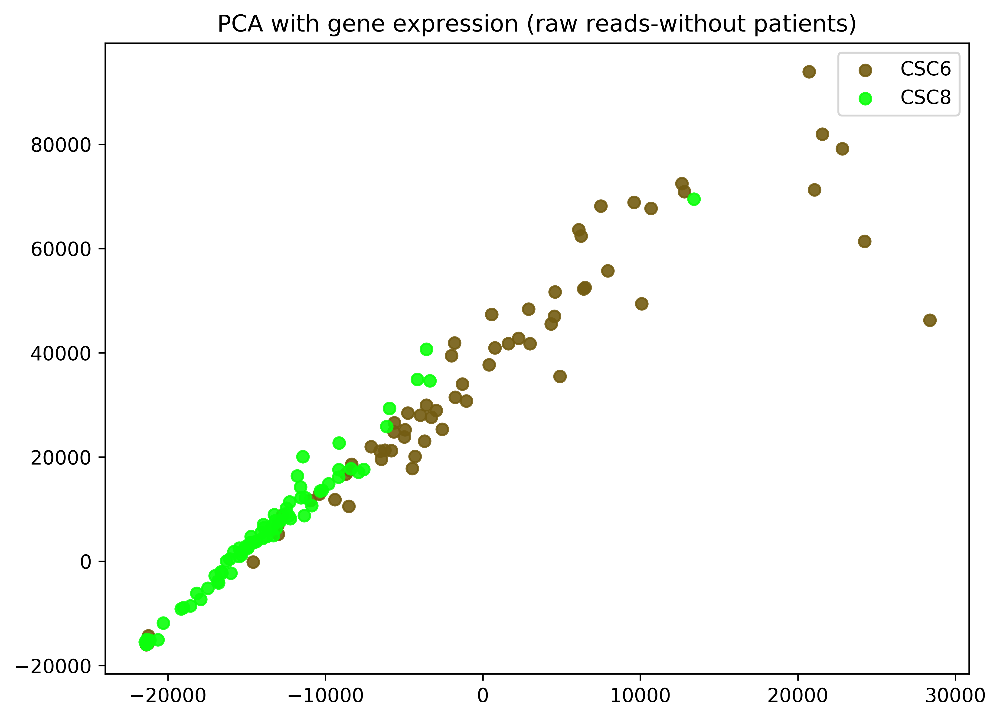

In [29]:
for color, target_name in zip(colors, filtered_type):
    if ('CSC' in target_name):
        plt.scatter(x_1[cell_labels == target_name], x_2[cell_labels == target_name], color=color, alpha=.9, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads-without patients)')

In [30]:
# only distinguish patients and non-patients
cell_labels_2_class = label_info_filtered.label.str.slice(stop=3).values
filtered_type_2_class = ['CSC','MGH']

Text(0.5, 1.0, 'PCA with gene expression(raw reads)')

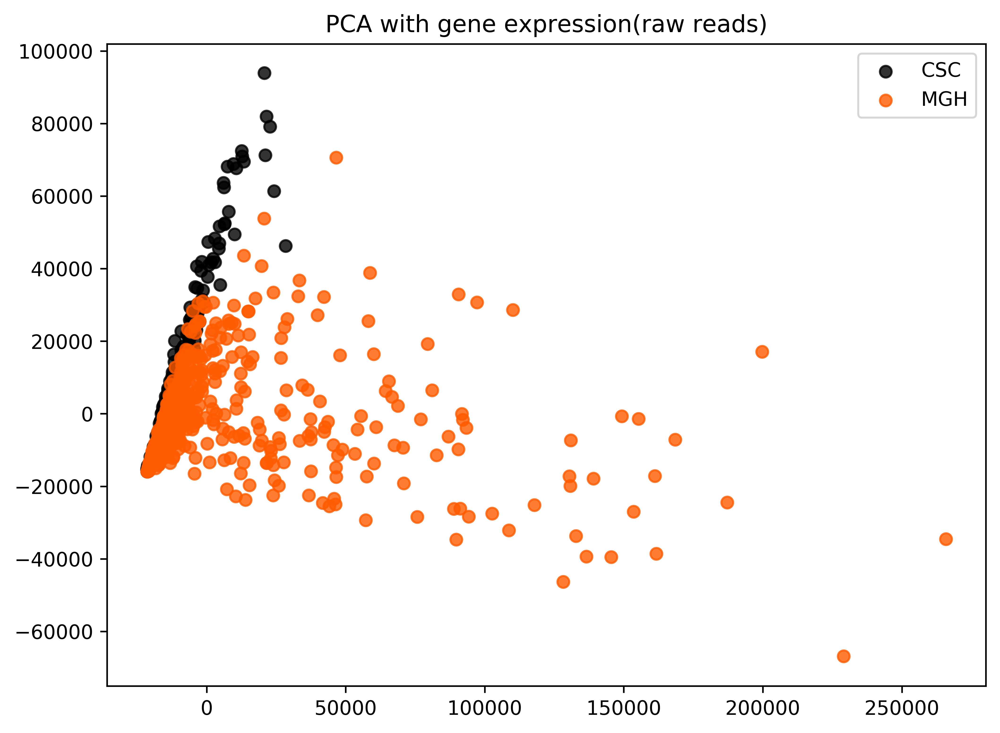

In [31]:
for color, target_name in zip(colors, filtered_type_2_class):
    plt.scatter(x_1[cell_labels_2_class == target_name], x_2[cell_labels_2_class == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression(raw reads)')

## Considering outliers

In [32]:
stats_file = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/mapping_stat/mapping_stat.csv"
stats_info = pd.read_csv(stats_file,index_col=0)

In [33]:
stats_info_filtered = stats_info.loc[label_info_filtered.index.values,]

In [34]:
# standard variance
stats_info_filtered['Unique_Percent'].str.rstrip('%').astype('float').std()

21.269318525988243

In [35]:
# average
stats_info_filtered['Unique_Percent'].str.rstrip('%').astype('float').mean()

58.72830729166666

In [36]:
# use 50 percentage as threthold
sum(stats_info_filtered['Unique_Percent'].str.rstrip('%').astype('float') < 50 )

175

In [37]:
# after filter by unique mapping rate
stats_info_filtered_rate = stats_info_filtered.loc[stats_info_filtered['Unique_Percent'].str.rstrip('%').astype('float') > 60,]

In [38]:
sum(stats_info_filtered_rate['Unique']<1000000)

27

In [39]:
# use 10^6 as unique mapping reads threshold
stats_info_filtered_rate_reads = stats_info_filtered_rate.loc[stats_info_filtered_rate['Unique']>1000000,]

In [40]:
stats_info_filtered.shape

(768, 8)

In [143]:
stats_info_filtered_rate_reads.shape

(498, 8)

In [194]:
exp_no_outlier = exp_profile_filtered.loc[stats_info_filtered_rate_reads.index.values,]
# remove outliers furthur
# here I use 3500 to be threshold as gene numbers
not_pass = (((exp_no_outlier > 0).sum(axis=1) < 3500)[(exp_no_outlier > 0).sum(axis=1) < 3500]).index.values
exp_no_outlier = exp_no_outlier.loc[~exp_no_outlier.index.isin(not_pass),]
# change stats_info
stats_info_filtered_rate_reads = stats_info_filtered_rate_reads.loc[~stats_info_filtered_rate_reads.index.isin(not_pass),]

In [195]:
stats_info_filtered_rate_reads.shape

(489, 8)

In [160]:
exp_no_outlier

Geneid,ENSG00000223972.4,ENSG00000227232.4,ENSG00000243485.2,ENSG00000237613.2,ENSG00000268020.2,ENSG00000240361.1,ENSG00000186092.4,ENSG00000238009.2,ENSG00000239945.1,ENSG00000233750.3,...,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
SRR1294493,0,0,0,0,0,0,0,0,0,0,...,341,0,0,0,58,4,0,190,0,0
SRR1294494,0,0,0,0,0,0,0,0,0,0,...,518,0,0,0,92,81,0,225,0,0
SRR1294496,0,0,0,0,0,0,0,0,0,0,...,2956,0,0,0,1012,248,1,1732,8,4
SRR1294497,0,0,0,0,0,0,0,0,0,0,...,2530,0,0,0,688,325,3,388,0,0
SRR1294498,0,0,0,0,0,0,0,0,0,0,...,3355,0,1,3,1088,538,3,1777,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR1295349,0,0,0,0,0,0,0,0,0,0,...,3397,1,0,3,704,131,0,1351,5,21
SRR1295350,0,0,0,0,0,0,0,0,0,0,...,5070,2,0,0,1006,216,1,2271,4,28
SRR1295352,0,0,0,0,0,0,0,0,0,2,...,4428,1,0,2,826,271,2,2135,13,21
SRR1295354,0,0,0,0,0,0,0,0,0,0,...,3202,2,2,2,792,184,0,1774,0,18


In [161]:
outliers = list(set(stats_info_filtered.index.values) - set(stats_info_filtered_rate_reads.index.values) -
               set(not_pass))
outlier_type = ['yes', 'no']
outlier_label = []

for cell in exp_profile_filtered.index.values:
    if cell in outliers:
        outlier_label.append('yes')
    else:
        outlier_label.append('no')
outlier_label = np.array(outlier_label)

Text(0.5, 1.0, 'PCA with gene expression(raw reads)')

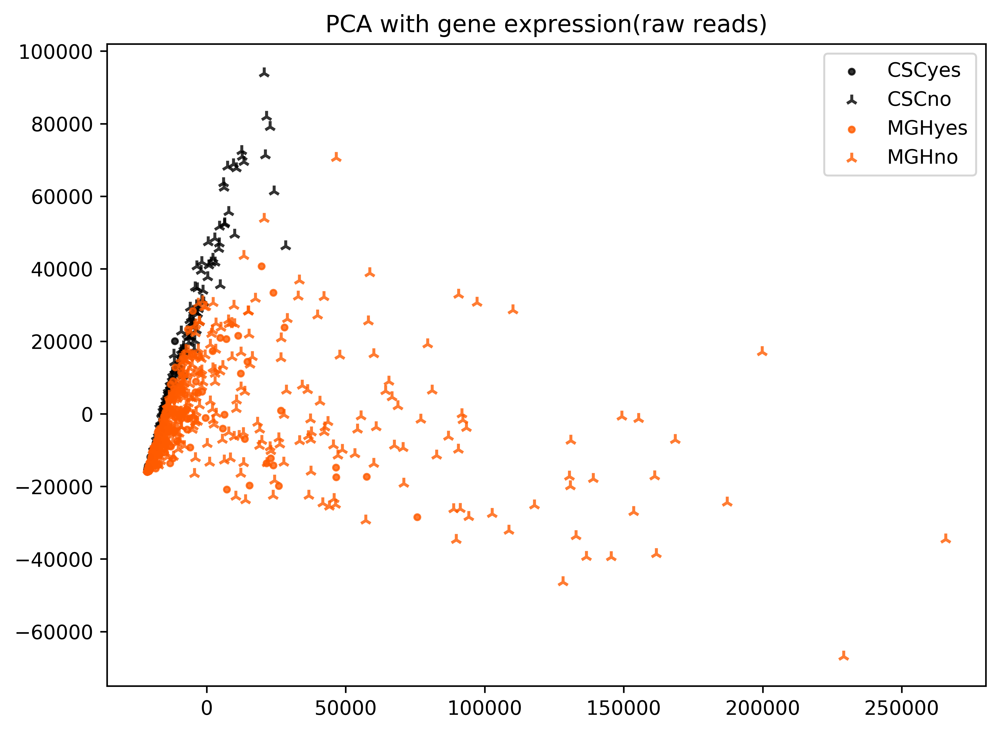

In [162]:
shapes = ['.','2']
for color, target_name in zip(colors, filtered_type_2_class):
    for shape, outlier in zip(shapes,outlier_type):
        plt.scatter(x_1[(cell_labels_2_class == target_name) &(outlier_label == outlier)], x_2[(cell_labels_2_class == target_name) & (outlier_label == outlier)], color=color, marker=shape,alpha=.8,label=target_name+outlier)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression(raw reads)')

## Remove outliers

In [163]:
pca_no_outlier = PCA(n_components=2)
pca_no_outlier.fit(exp_no_outlier)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [164]:
print(pca_no_outlier.explained_variance_ratio_)

[0.4680885  0.11655181]


In [165]:
X_r_no_outlier = pca_no_outlier.transform(exp_no_outlier)
x_1_no_outlier = X_r_no_outlier.ravel(order='F')[:X_r_no_outlier.shape[0]]
x_2_no_outlier = X_r_no_outlier.ravel(order='F')[X_r_no_outlier.shape[0]:]

In [166]:
cell_labels_no_outlier = label_info_filtered.loc[exp_no_outlier.index.values,]['label'].values

In [179]:
label_info_filtered.loc[exp_no_outlier.index.values,]['label'].value_counts()

MGH26    97
MGH29    74
MGH30    73
MGH31    68
CSC8     65
CSC6     61
MGH28    51
Name: label, dtype: int64

Text(0.5, 1.0, 'PCA with gene expression (raw reads no outliers)')

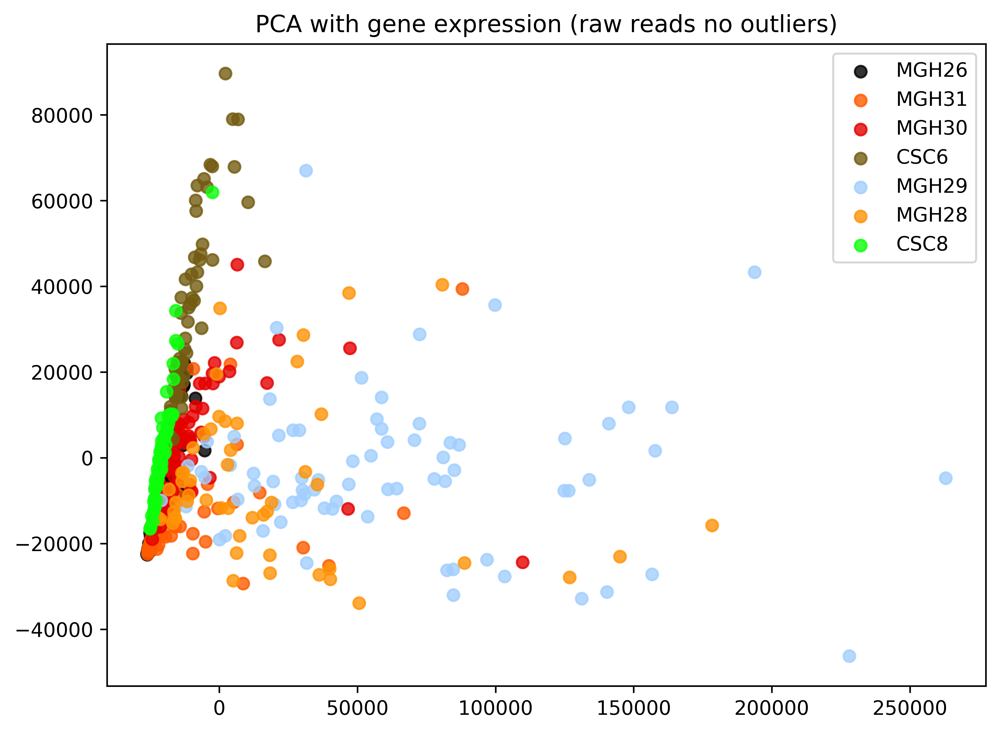

In [181]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_no_outlier[cell_labels_no_outlier == target_name], x_2_no_outlier[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads no outliers)')

Text(0.5, 1.0, 'PCA with gene expression (raw reads no outliers)')

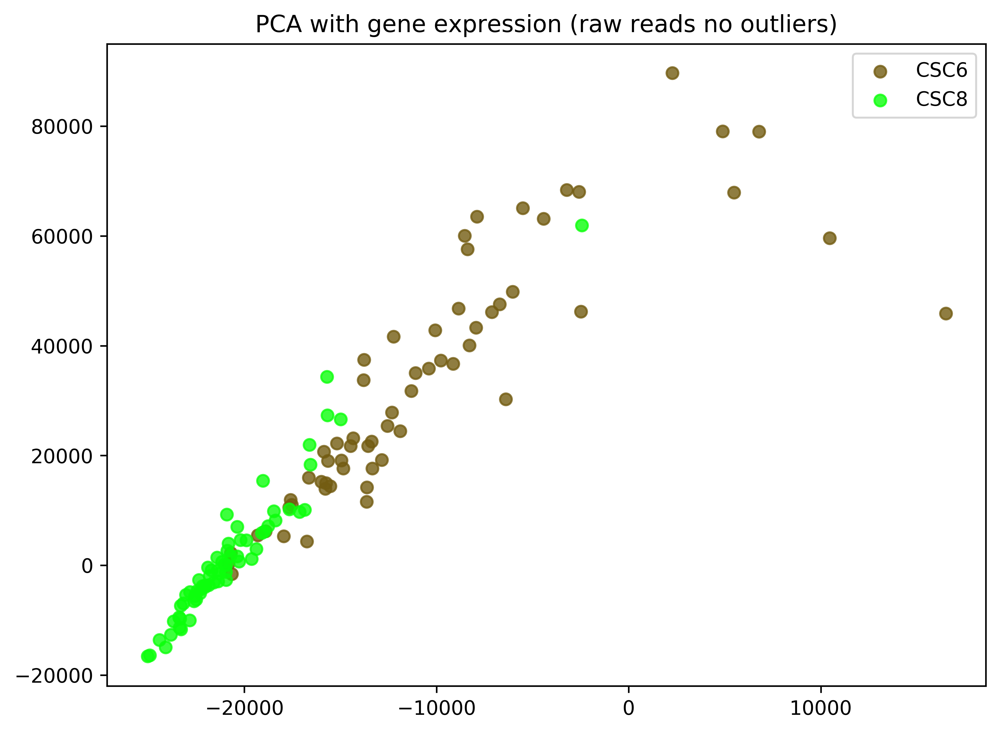

In [182]:
for color, target_name in zip(colors, filtered_type):
    if ('CSC' in target_name):
        plt.scatter(x_1_no_outlier[cell_labels_no_outlier == target_name], x_2_no_outlier[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads no outliers)')

Text(0.5, 1.0, 'PCA with gene expression (raw reads no outliers)')

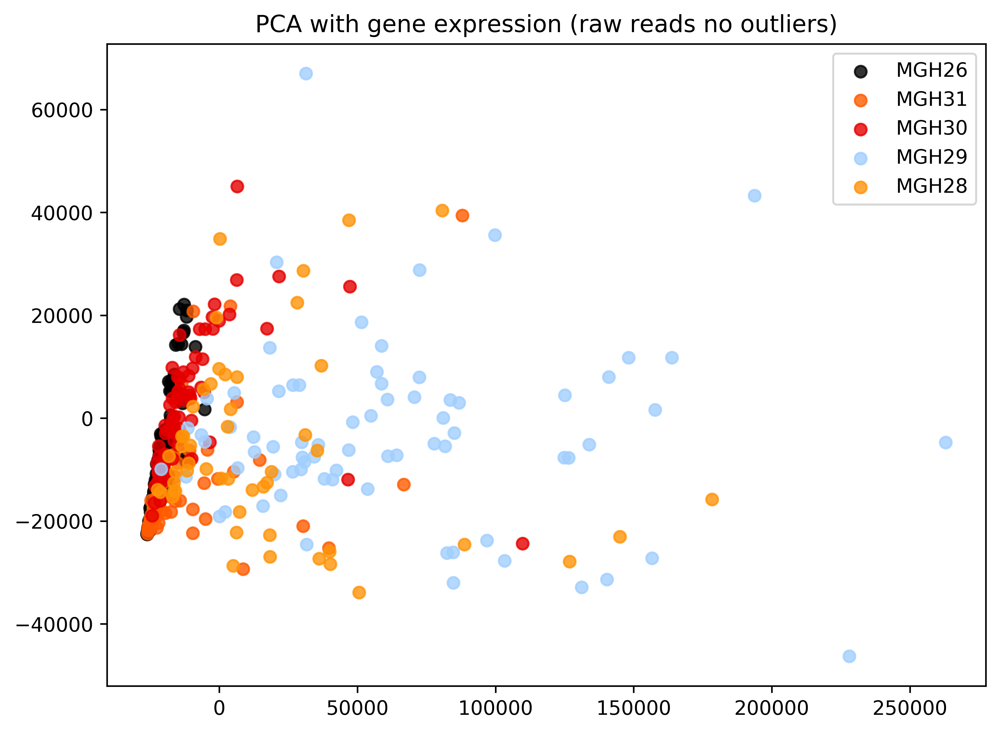

In [183]:
for color, target_name in zip(colors, filtered_type):
    if ('MGH' in target_name):
        plt.scatter(x_1_no_outlier[cell_labels_no_outlier == target_name], x_2_no_outlier[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads no outliers)')

## Remove non-sense gene, use 30 cell numbers

In [240]:
valid_gene_id = ((exp_no_outlier>0).sum())[(exp_no_outlier>0).sum() > 30].index

In [243]:
exp_no_outlier_valid = exp_no_outlier.loc[:,valid_gene_id]

In [250]:
exp_no_outlier_valid.shape

(489, 25487)

In [244]:
pca_no_outlier_valid = PCA(n_components=2)
pca_no_outlier_valid.fit(exp_no_outlier_valid)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [245]:
print(pca_no_outlier_valid.explained_variance_ratio_)

[0.46819221 0.11657717]


In [246]:
X_r_no_outlier_valid = pca_no_outlier_valid.transform(exp_no_outlier_valid)
x_1_no_outlier_valid = X_r_no_outlier_valid.ravel(order='F')[:X_r_no_outlier_valid.shape[0]]
x_2_no_outlier_valid = X_r_no_outlier_valid.ravel(order='F')[X_r_no_outlier_valid.shape[0]:]

In [247]:
cell_labels_no_outlier = label_info_filtered.loc[exp_no_outlier_valid.index.values,]['label'].values

Text(0.5, 1.0, 'PCA with gene expression (raw reads no outliers valid genes)')

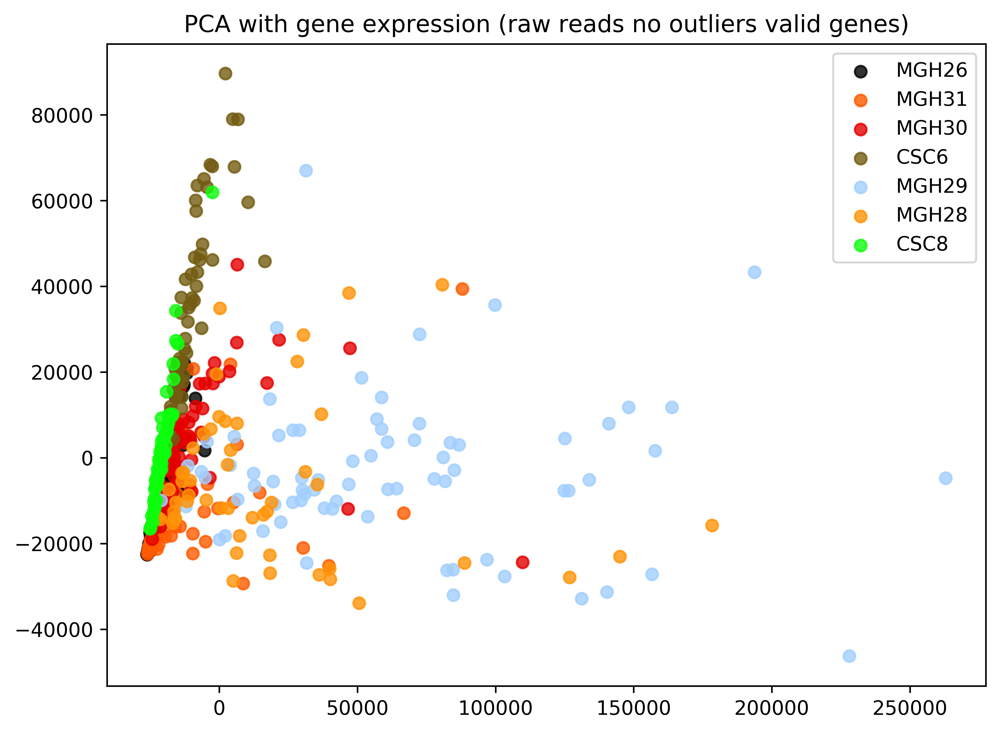

In [249]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_no_outlier_valid[cell_labels_no_outlier == target_name], x_2_no_outlier_valid[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads no outliers valid genes)')

## Gene expression raw reads without outliers with standard

In [184]:
exp_no_outlier_standard = pd.DataFrame(StandardScaler().fit_transform(exp_no_outlier), index=exp_no_outlier.index, columns=exp_no_outlier.columns )

/home/mtx/software/anaconda3/envs/r_sceqtl/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/home/mtx/software/anaconda3/envs/r_sceqtl/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [185]:
pca_standard = PCA(n_components=2)
pca_standard.fit(exp_no_outlier_standard)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [186]:
print(pca_standard.explained_variance_ratio_)

[0.02193447 0.00962988]


In [187]:
X_r_standard = pca_standard.transform(exp_no_outlier_standard)
x_1_standard = X_r_standard.ravel(order='F')[:X_r_standard.shape[0]]
x_2_standard = X_r_standard.ravel(order='F')[X_r_standard.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (raw reads, standard, no outliers)')

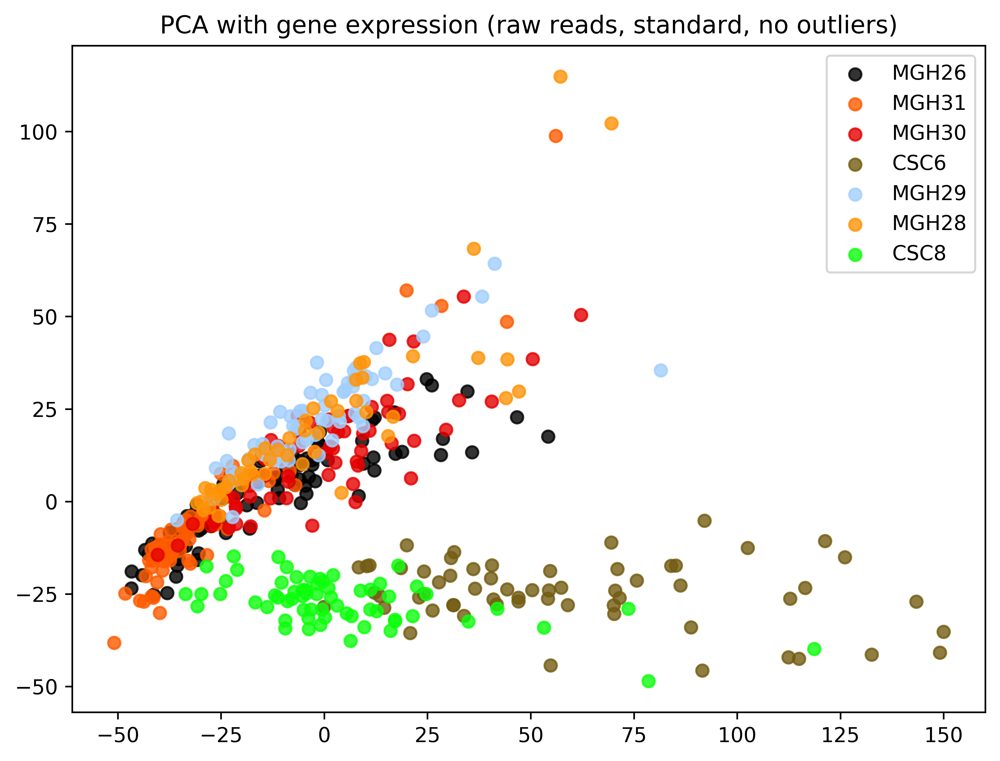

In [188]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_standard[cell_labels_no_outlier == target_name], x_2_standard[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (raw reads, standard, no outliers)')

## tsne without outliers

In [189]:
tsne = manifold.TSNE(n_components=2, init='random',
                         random_state=0, perplexity=100)
y_tsne = tsne.fit_transform(exp_no_outlier)

x_1_tsne = y_tsne.ravel(order='F')[:y_tsne.shape[0]]
x_2_tsne = y_tsne.ravel(order='F')[y_tsne.shape[0]:]

<Figure size 30000x24000 with 0 Axes>

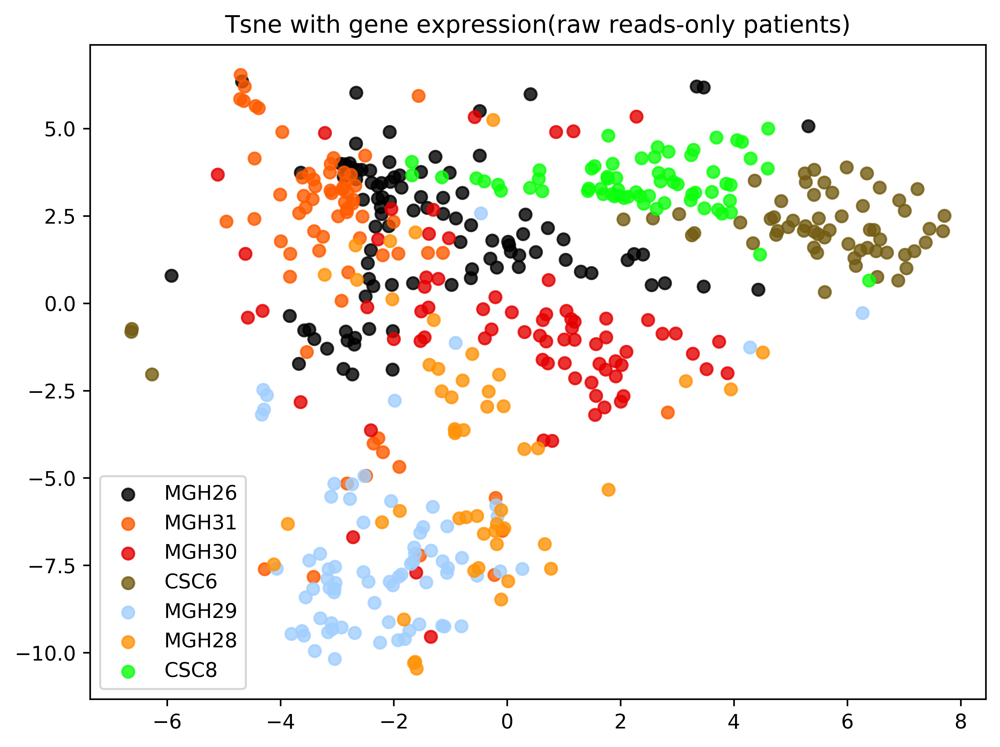

<Figure size 30000x24000 with 0 Axes>

In [190]:
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_tsne[cell_labels_no_outlier == target_name], x_2_tsne[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
            label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('Tsne with gene expression(raw reads-only patients)')
plt.figure(figsize=(50,40))

# Gene Expression with CPM

In [196]:
cpm_file = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/quantification_stats/gene_expression_matrix/gene_expression_matrix_cpm.csv"
cpm_profile = pd.read_csv(cpm_file,index_col=0).transpose()
# remove outliers
cpm_profile = cpm_profile.loc[stats_info_filtered_rate_reads.index.values,]

In [197]:
cpm_profile 

Geneid,ENSG00000223972.4,ENSG00000227232.4,ENSG00000243485.2,ENSG00000237613.2,ENSG00000268020.2,ENSG00000240361.1,ENSG00000186092.4,ENSG00000238009.2,ENSG00000239945.1,ENSG00000233750.3,...,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
SRR1294493,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,1127.529916,0.000000,0.000000,0.000000,191.779282,13.226157,0.000000,628.242475,0.000000,0.000000
SRR1294494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,1870.839819,0.000000,0.000000,0.000000,332.272709,292.544451,0.000000,812.623474,0.000000,0.000000
SRR1294496,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,2852.546689,0.000000,0.000000,0.000000,976.582290,239.320561,0.965002,1671.383919,7.720018,3.860009
SRR1294497,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,2123.744640,0.000000,0.000000,0.000000,577.524234,272.813047,2.518274,325.696806,0.000000,0.000000
SRR1294498,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,2825.063322,0.000000,0.842046,2.526137,916.145721,453.020586,2.526137,1496.315208,1.684091,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR1295349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,7584.265273,2.232636,0.000000,6.697909,1571.775906,292.475346,0.000000,3016.291547,11.163181,46.885361
SRR1295350,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,6309.344550,2.488893,0.000000,0.000000,1251.913337,268.800478,1.244447,2826.138358,4.977787,34.844506
SRR1295352,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.374688,...,5257.558631,1.187344,0.000000,2.374688,980.746032,321.770187,2.374688,2534.979150,15.435470,24.934221
SRR1295354,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,5090.215404,3.179398,3.179398,3.179398,1259.041412,292.504570,0.000000,2820.125586,0.000000,28.614578


In [198]:
pca_cpm = PCA(n_components=2)
pca_cpm.fit(cpm_profile)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [199]:
print(pca_cpm.explained_variance_ratio_)

[0.41790276 0.09349066]


In [200]:
X_r_cpm = pca_cpm.transform(cpm_profile)
x_1_cpm = X_r_cpm.ravel(order='F')[:X_r_cpm.shape[0]]
x_2_cpm = X_r_cpm.ravel(order='F')[X_r_cpm.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (CPM no outliers)')

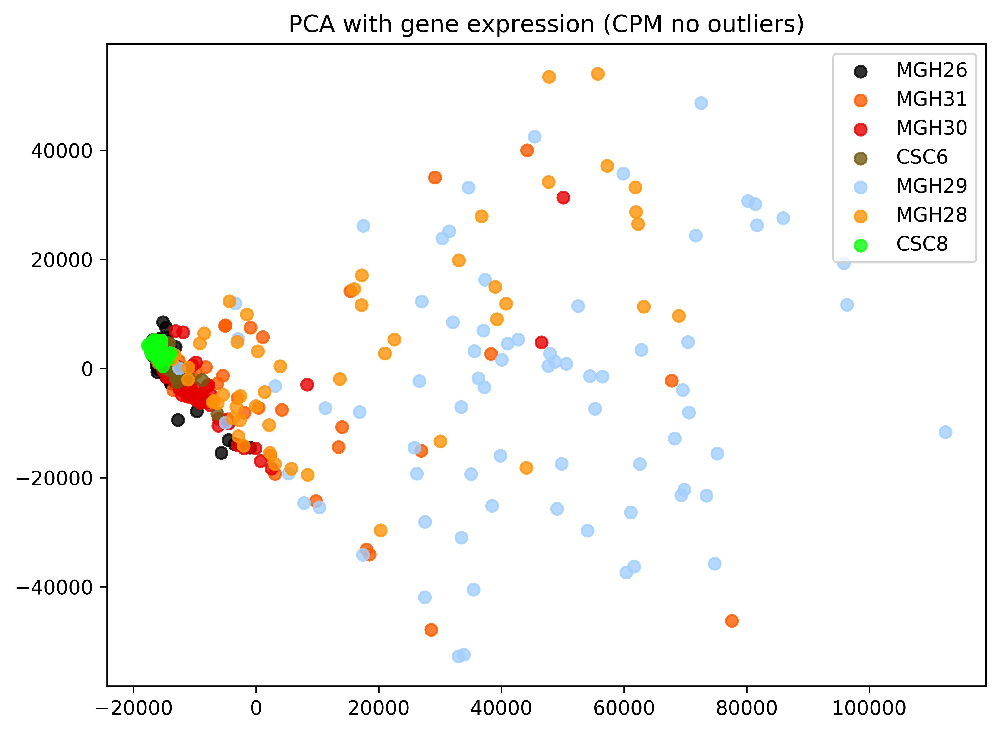

In [201]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_cpm[cell_labels_no_outlier == target_name], x_2_cpm[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (CPM no outliers)')

## Gene Expression with CPM (Standard)

In [202]:
cpm_profile_standard = pd.DataFrame(StandardScaler().fit_transform(cpm_profile), index=cpm_profile.index, columns=cpm_profile.columns )

In [203]:
pca_standard_cpm = PCA(n_components=2)
pca_standard_cpm.fit(cpm_profile_standard)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [204]:
X_r_cpm_standard = pca_standard_cpm.transform(cpm_profile_standard)
x_1_cpm_standard = X_r_cpm_standard.ravel(order='F')[:X_r_cpm_standard.shape[0]]
x_2_cpm_standard = X_r_cpm_standard.ravel(order='F')[X_r_cpm_standard.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (CPM no outliers,standard)')

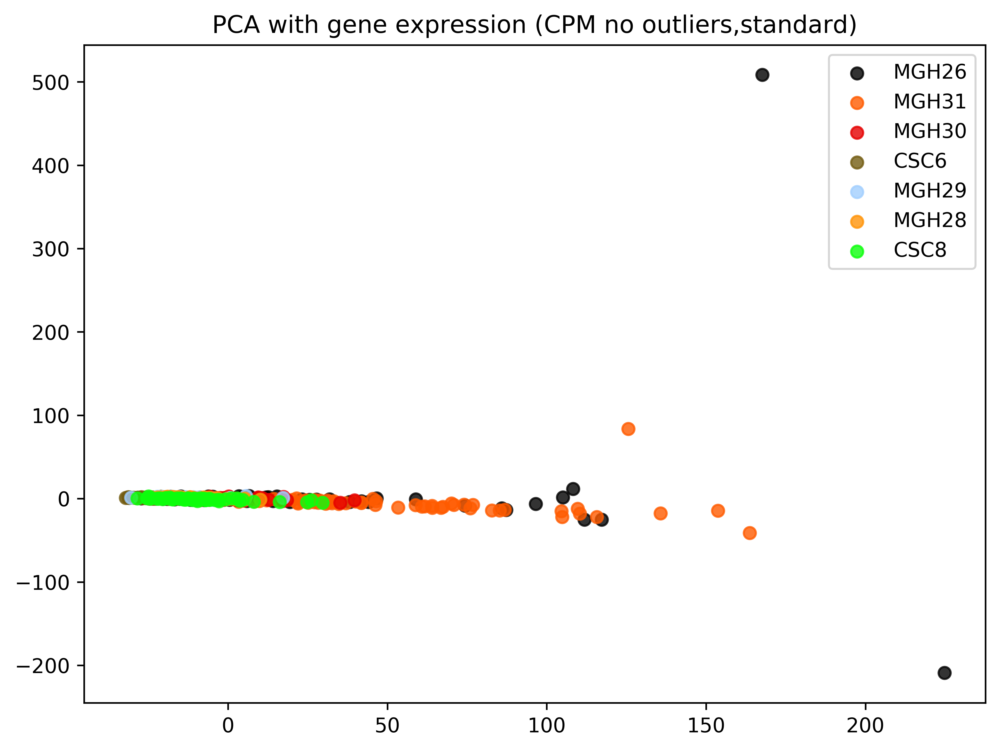

In [205]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_cpm_standard[cell_labels_no_outlier == target_name], x_2_cpm_standard[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (CPM no outliers,standard)')

# Gene Expression with TPM

In [206]:
tpm_file = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/quantification_stats/gene_expression_matrix/gene_expression_matrix_tpm.csv"
tpm_profile = pd.read_csv(tpm_file,index_col=0).transpose()
# remove outliers
tpm_profile = tpm_profile.loc[stats_info_filtered_rate_reads.index.values,]

In [207]:
pca_tpm = PCA(n_components=2)
pca_tpm.fit(tpm_profile)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [208]:
print(pca_tpm.explained_variance_ratio_)

[0.2861398  0.17525598]


In [209]:
X_r_tpm = pca_tpm.transform(tpm_profile)
x_1_tpm = X_r_tpm.ravel(order='F')[:X_r_tpm.shape[0]]
x_2_tpm = X_r_tpm.ravel(order='F')[X_r_tpm.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (TPM no outliers)')

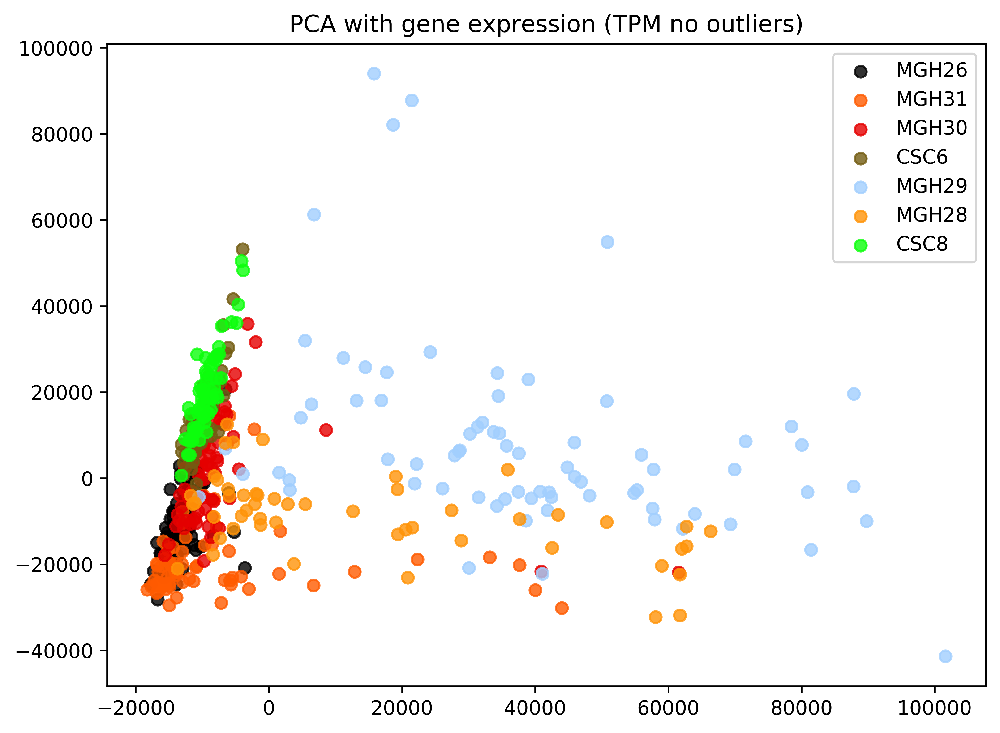

In [210]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_tpm[cell_labels_no_outlier == target_name], x_2_tpm[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (TPM no outliers)')

## Gene Expression with TPM (standard)

In [211]:
tpm_profile_standard = pd.DataFrame(StandardScaler().fit_transform(tpm_profile), index=tpm_profile.index, columns=tpm_profile.columns )

In [212]:
pca_tpm_standard = PCA(n_components=2)
pca_tpm_standard.fit(tpm_profile_standard)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [213]:
X_r_tpm_standard = pca_tpm_standard.transform(tpm_profile_standard)
x_1_tpm_standard = X_r_tpm_standard.ravel(order='F')[:X_r_tpm_standard.shape[0]]
x_2_tpm_standard = X_r_tpm_standard.ravel(order='F')[X_r_tpm_standard.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (TPM no outliers,standard)')

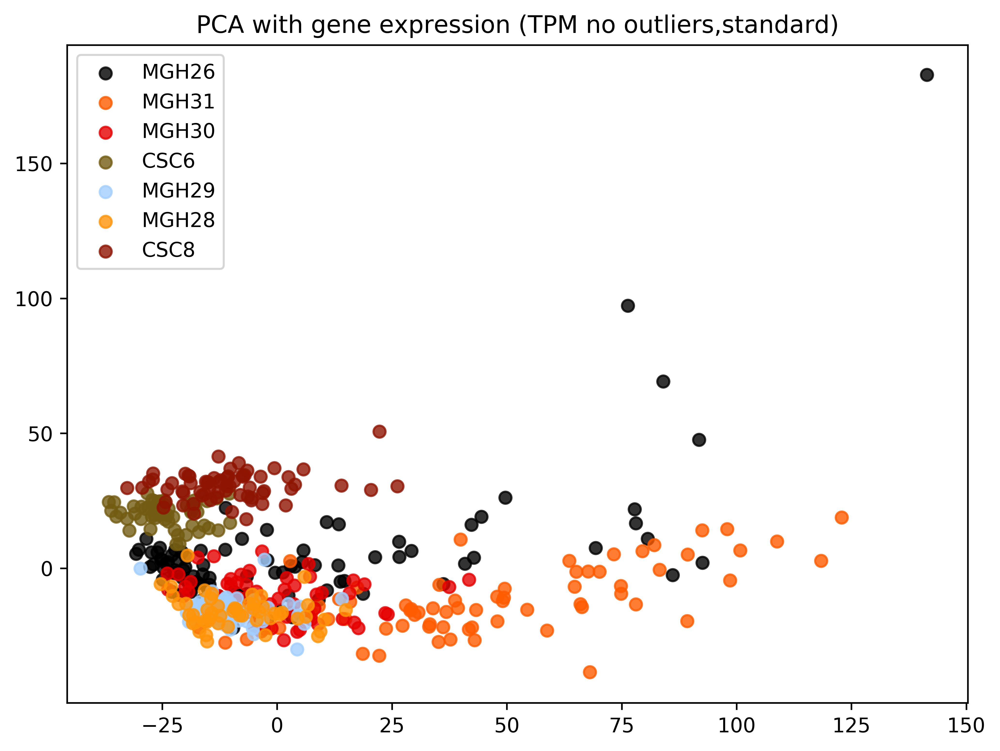

In [214]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#8f1402', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_tpm_standard[cell_labels_no_outlier == target_name], x_2_tpm_standard[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (TPM no outliers,standard)')

# Gene Expression with RPKM

In [215]:
rpkm_file = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/quantification_stats/gene_expression_matrix/gene_expression_matrix_fpkm.csv"
rpkm_profile = pd.read_csv(rpkm_file,index_col=0).transpose()
# remove outliers
rpkm_profile = rpkm_profile.loc[stats_info_filtered_rate_reads.index.values,]

In [216]:
pca_rpkm = PCA(n_components=2)
pca_rpkm.fit(rpkm_profile)
X_r_rpkm = pca_rpkm.transform(rpkm_profile)
x_1_rpkm = X_r_rpkm.ravel(order='F')[:X_r_rpkm.shape[0]]
x_2_rpkm = X_r_rpkm.ravel(order='F')[X_r_rpkm.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (RPKM no outliers)')

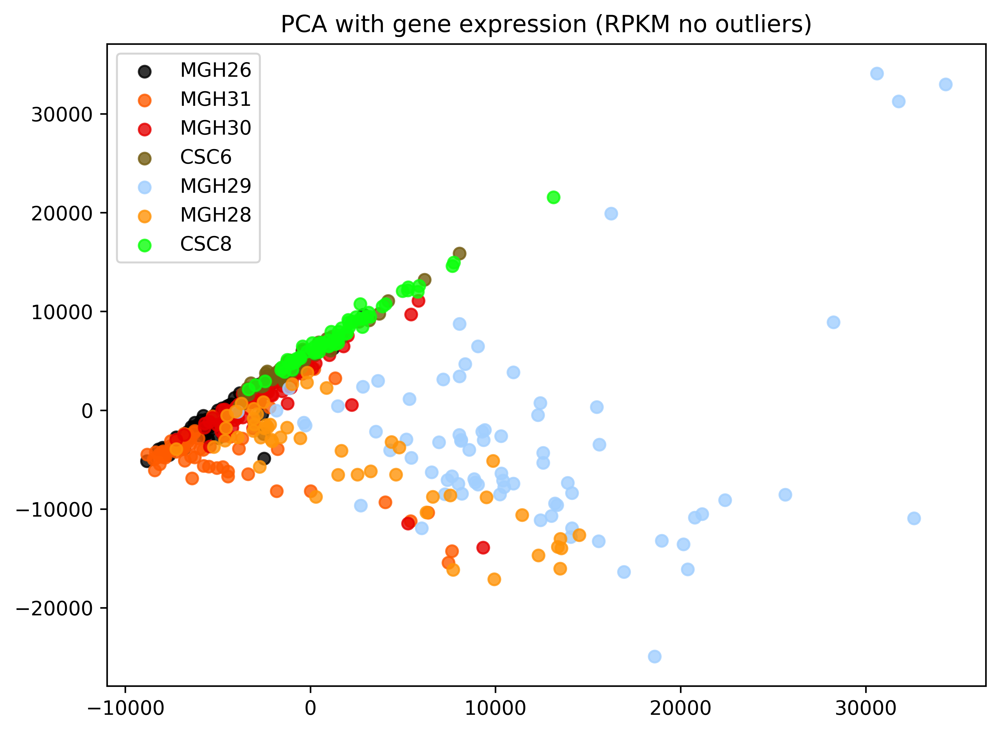

In [217]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408', '#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_rpkm[cell_labels_no_outlier == target_name], x_2_rpkm[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (RPKM no outliers)')

## Gene Expression with RPKM (Standard)

In [218]:
rpkm_profile_standard = pd.DataFrame(StandardScaler().fit_transform(rpkm_profile), index=rpkm_profile.index, columns=rpkm_profile.columns )

In [219]:
pca_rpkm_standard = PCA(n_components=2)
pca_rpkm_standard.fit(rpkm_profile_standard)
X_r_rpkm_standard = pca_rpkm_standard.transform(rpkm_profile_standard)
x_1_rpkm_standard = X_r_rpkm_standard.ravel(order='F')[:X_r_rpkm_standard.shape[0]]
x_2_rpkm_standard = X_r_rpkm_standard.ravel(order='F')[X_r_rpkm_standard.shape[0]:]

Text(0.5, 1.0, 'PCA with gene expression (RPKM no outliers, standard)')

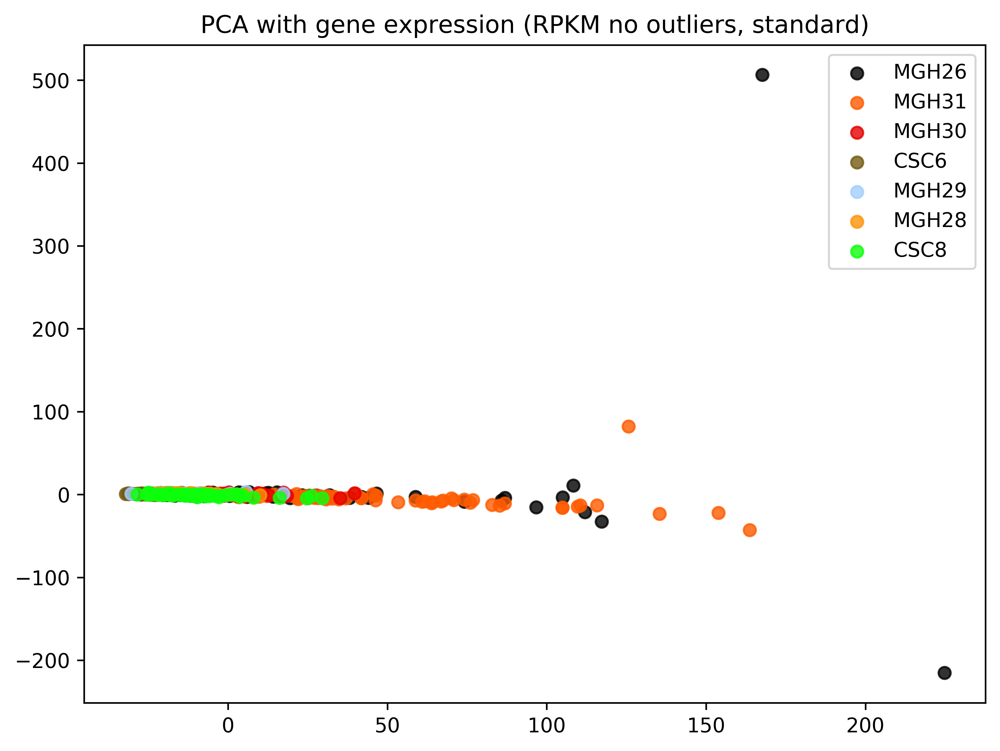

In [220]:
colors = ['#000000', '#ff5b00', '#e50000', '#735c12', '#a2cffe', '#ff9408','#0cff0c','#fdaa48']
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_rpkm_standard[cell_labels_no_outlier == target_name], x_2_rpkm_standard[cell_labels_no_outlier == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with gene expression (RPKM no outliers, standard)')

# SNV matrix without outliers

In [221]:
path_to_saved_snv_df = os.path.join("/data8t/mtx/scSNV/dataset_v2/GSE57872/data/snv", "GSE57872_snv_matrix_10.csv")
snv_df = pd.read_csv(path_to_saved_snv_df,index_col=0)
snv_df = snv_df.transpose()

In [222]:
# remove outliers
snv_df_no_outliers = snv_df.loc[exp_no_outlier.index.values,]

In [223]:
snv_df_no_outliers

SNVid,chr1__881627,chr1__888639,chr1__1247494,chr1__7901995,chr1__11148759,chr1__13940864,chr1__13942731,chr1__20826685,chr1__20826686,chr1__20826910,...,chr11__12758660,chr9__111801285,chr19__57845775,chr8__29330273,chr18__12836305,chr6__7661631,chr5__106815995,chr8__119047458,chr11__103079797,chr6__29858221
SRR1294493,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1294494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
SRR1294496,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1294497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1294498,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR1295349,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1295350,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1295352,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1295354,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [224]:
pcasnv = PCA(n_components=2)
pcasnv.fit(snv_df_no_outliers)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [225]:
X_r_snv = pcasnv.transform(snv_df_no_outliers)
x_1_snv = X_r_snv.ravel(order='F')[:X_r_snv.shape[0]]
x_2_snv = X_r_snv.ravel(order='F')[X_r_snv.shape[0]:]

In [226]:
y_snv=snv_df_no_outliers.merge(label_info_filtered,left_index=True,right_index=True)['label'].values

Text(0.5, 1.0, 'PCA with SNV expression no outliers')

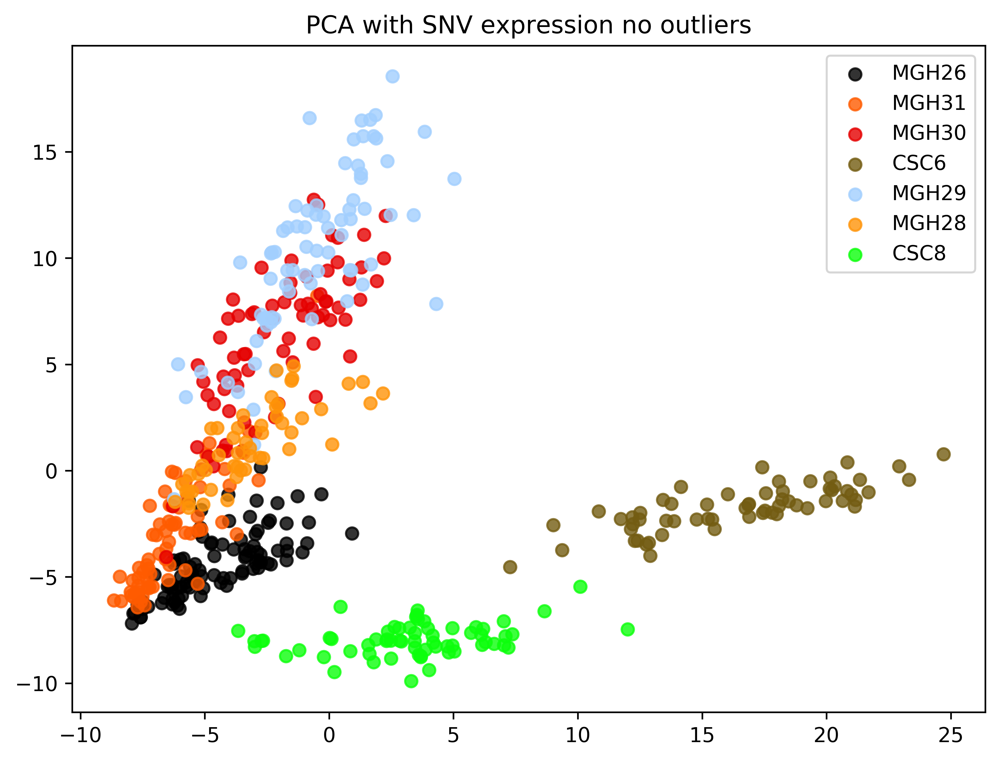

In [227]:
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_snv[y_snv == target_name], x_2_snv[y_snv == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with SNV expression no outliers')

Text(0.5, 1.0, 'PCA with SNV expression')

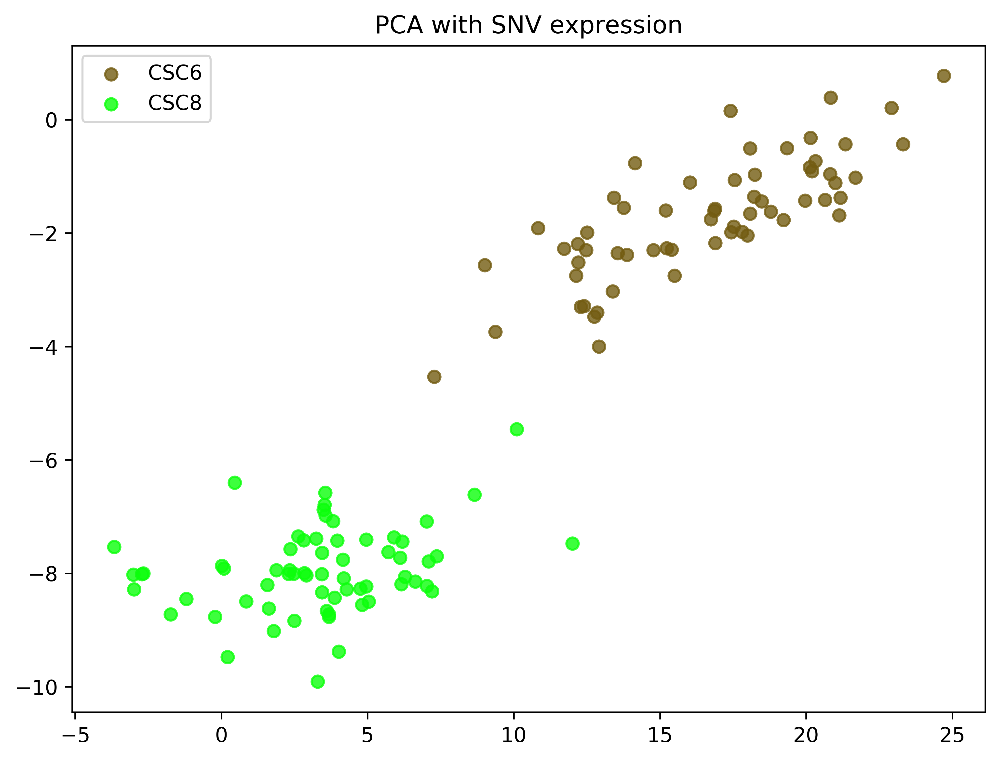

In [228]:
for color, target_name in zip(colors, filtered_type):
    if ('CSC' in target_name):
        plt.scatter(x_1_snv[y_snv == target_name], x_2_snv[y_snv == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with SNV expression')

Text(0.5, 1.0, 'PCA with SNV expression')

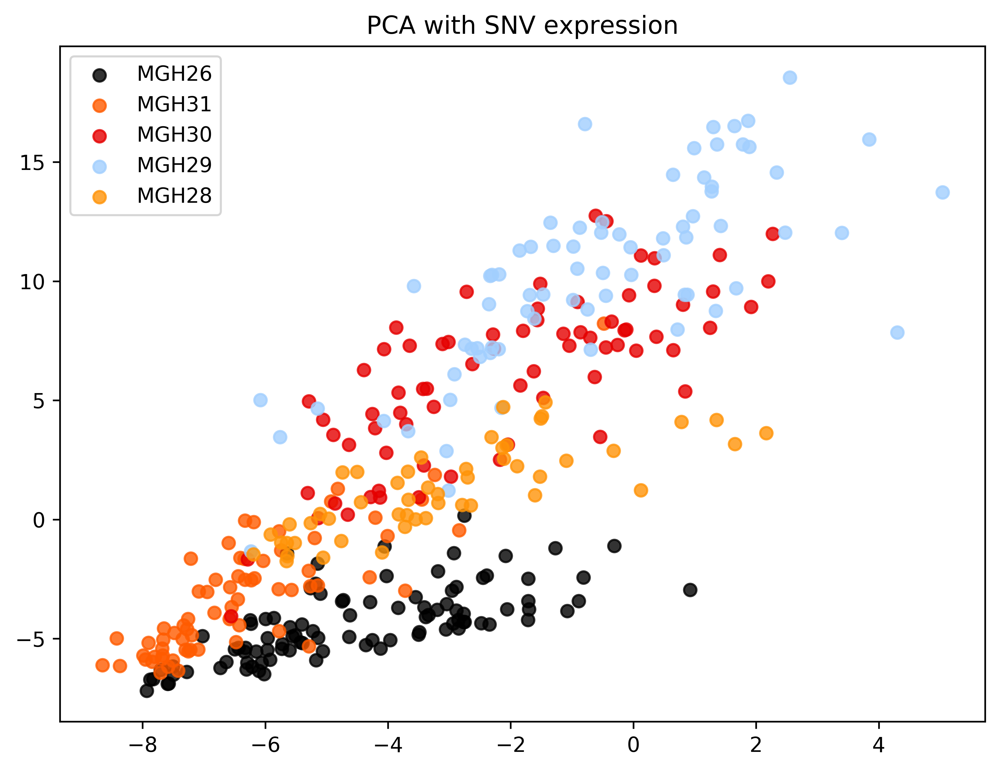

In [229]:
for color, target_name in zip(colors, filtered_type):
    if ('MGH' in target_name):
        plt.scatter(x_1_snv[y_snv == target_name], x_2_snv[y_snv == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with SNV expression')

# Remove non-sence SNV 

In [230]:
snv_df_no_outliers

SNVid,chr1__881627,chr1__888639,chr1__1247494,chr1__7901995,chr1__11148759,chr1__13940864,chr1__13942731,chr1__20826685,chr1__20826686,chr1__20826910,...,chr11__12758660,chr9__111801285,chr19__57845775,chr8__29330273,chr18__12836305,chr6__7661631,chr5__106815995,chr8__119047458,chr11__103079797,chr6__29858221
SRR1294493,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1294494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
SRR1294496,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1294497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1294498,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR1295349,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1295350,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1295352,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SRR1295354,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [231]:
gtf_index_df = pd.read_csv("/data8t/mtx/scSNV/dataset_v1/kim/data/gtf_index/GTF_index.csv", index_col='Geneid')

In [232]:
def search_snv_from_gtfindex(snv_list, gtf_index_df):
    # snv_list can be list or numpy array
    # for str, try to convert it to list(with only one snv)
    # each item in snv_list is named like chr7_123
    if isinstance(snv_list, str):
        snv_list = [snv_list]
    snv_location = defaultdict(list)
    j = 0
    for i in snv_list:
        j += 1
        if j%5000 == 0:
            print(j)
        chrom = i.split("__")[0]
        pos = int(i.split("__")[1])
        result_df = gtf_index_df[(gtf_index_df['chr'] == chrom) & (gtf_index_df['start'] <= pos) & (gtf_index_df['end'] >= pos)]
        gene_id_list = list(result_df.index.values)
        snv_location[i] = gene_id_list
    return snv_location

In [255]:
gtf_index_df = gtf_index_df.loc[valid_gene_id,]

In [256]:
gtf_index_df

,chr,start,end,gene_name
Geneid,,,,
ENSG00000241860.2,chr1,141474,173862,RP11-34P13.13
ENSG00000228463.4,chr1,227615,267253,AP006222.2
ENSG00000237094.7,chr1,317720,453948,RP4-669L17.10
ENSG00000225972.1,chr1,564442,564813,MTND1P23
ENSG00000225630.1,chr1,565020,566063,MTND2P28
...,...,...,...,...
ENSG00000198695.2,chrM,14149,14673,MT-ND6
ENSG00000210194.1,chrM,14674,14742,MT-TE
ENSG00000198727.2,chrM,14747,15887,MT-CYB


In [263]:
search_gene = search_snv_from_gtfindex(snv_df_no_outliers.columns.values, gtf_index_df)

5000
10000
15000
20000
25000
30000
35000
40000
45000
50000
55000
60000


In [268]:
valid_snv = []
for i in search_gene:
    if len(search_gene[i]) > 0:
        valid_snv.append(i)

In [270]:
len(valid_snv)

52131

In [271]:
snv_df_no_outliers_on_gene = snv_df_no_outliers.loc[:,valid_snv]

In [272]:
snv_df_no_outliers_on_gene.shape

(489, 52131)

In [273]:
pcasnv_on_gene = PCA(n_components=2)
pcasnv_on_gene.fit(snv_df_no_outliers_on_gene)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [274]:
X_r_snv_on_gene = pcasnv_on_gene.transform(snv_df_no_outliers_on_gene)
x_1_snv_on_gene = X_r_snv_on_gene.ravel(order='F')[:X_r_snv_on_gene.shape[0]]
x_2_snv_on_gene = X_r_snv_on_gene.ravel(order='F')[X_r_snv_on_gene.shape[0]:]

In [275]:
y_snv_on_gene=snv_df_no_outliers_on_gene.merge(label_info_filtered,left_index=True,right_index=True)['label'].values

Text(0.5, 1.0, 'PCA with SNV expression no outliers on genes')

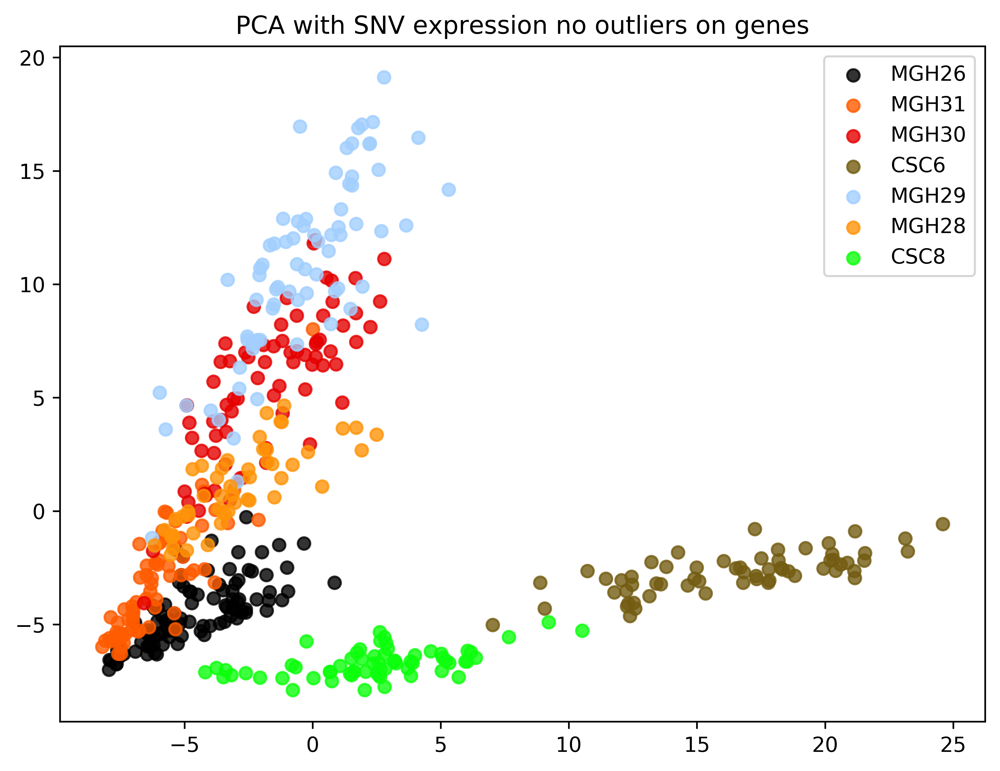

In [279]:
for color, target_name in zip(colors, filtered_type):
    plt.scatter(x_1_snv_on_gene[y_snv_on_gene == target_name], x_2_snv_on_gene[y_snv_on_gene == target_name], color=color, alpha=.8, 
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA with SNV expression no outliers on genes')

# Save Gene matrix and SNV matrix

In [280]:
saved_path = "/data8t/mtx/scSNV/dataset_v2/GSE57872/data/processed_profile"
saved_gene_name_suffix = "GSE57872_gene_raw_reads_30_cells_3500_genes.csv"
saved_snv_name_suffix = "GSE57872_snv_on_filtered_genes.csv"
saved_gene_name = os.path.join(saved_path,saved_gene_name_suffix)
saved_snv_name = os.path.join(saved_path,saved_snv_name_suffix)

In [294]:
snv_df_no_outliers_on_gene.T.to_csv(saved_snv_name)

In [293]:
exp_no_outlier_valid.T.to_csv(saved_gene_name)

In [304]:
# too many snvs, so I decide to reduce the number
# here I use 30 as threshold of cell numbers for snv
ttt = snv_df_no_outliers_on_gene.sum()

In [322]:
ttt[ttt>40]

SNVid
chr1__888639        55
chr1__1247494      123
chr1__13940864     160
chr1__13942731     106
chr1__20982631     282
                  ... 
chr14__77935659     54
chrM__4413          41
chr1__66628829      48
chr7__130655734     41
chr17__41381981     44
Length: 3516, dtype: int64

In [321]:
3 * 5028 / 60 /24

10.475